# Mapping TissueTag annotations to traget object

### This notebook illustrates how to migrate TissueTag annotations to visium spot space in the form of an AnnData object but can also be used to match annotations to any type of spatial data in the form of a pandas DF

1) We will load the TissueTag annotated image of the visium dataset and translate the pixel level annotations to an hexagonal binned grid.
2) we will measure the minimal euclidean distances to the annotations and calculate 2 types of biological axes(OrganAxis). 
3) Finally we will migrate annotations to visium space and print some plots.

In [ ]:
import os
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
import tissue_tag as tt 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Part 1 - Load annotation names and colors 

In [ ]:
# set path
path_to_tissue_tag = ""
path = path_to_tissue_tag + '/data/tissue_tag_minimal_example_visium/' 

In [3]:
# load tissue annotations from TissueTag and migrate annotation to a 15um hexagonal grid and outputs the coordinates in ppm=1 

df_anno = tt.anno_to_grid(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    spot_diameter = 15, # this determines the grid density 
    load_colors=True,
)
df_anno['annotations'].value_counts()

loaded annotation image - annotations size - (3957, 3886)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
Generating grid with spot size - 15, with resolution of - 0.5 ppm


annotations
unassigned    174617
Cortex         85577
Medulla        26544
Edge           16058
Artifacts       5200
Other           2653
PVS             1360
HS               921
Vessels           40
Name: count, dtype: int64

# Part 2 - Calculate distances to structures and 2 versions of the axis

Here we calculate the relative distances of each spot in the grid to the closest corresponding K spots for each of the annotation categories. 

*note that here I selected K=10 to match the way we calculate the Cortico-Medullary axis for the thymus. However, since we have both broad (cortex,medulla) and fine grained (HS and PVS) structures in the same annotation. This might not be ideal for the fine grained structures. 

Ideally, you might prefer to have multiple annotation "layers" where you have broad and fine annotations separately as we have done in the paper and then select different K for each.   

In [4]:
print('calculating distances')
tt.dist2cluster_fast(
    df=df_anno,
    annotation='annotations',
    KNN=10
    ) # calculate minimum mean distance of each spot to clusters

calculating distances
calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
HS
Medulla
Other
PVS
Vessels
unassigned


{'Artifacts': array([2207.27254737, 2200.7902178 , 2194.39127439, ..., 1560.00976525,
        1572.62223702, 1585.27627036]),
 'Cortex': array([2138.49414387, 2128.73443023, 2118.9404129 , ..., 1696.99389909,
        1709.18827031, 1721.40092017]),
 'Edge': array([2076.90977893, 2067.245057  , 2057.49675507, ..., 1879.09446074,
        1893.37888086, 1907.67428519]),
 'HS': array([2640.94888411, 2632.46702531, 2624.04349871, ..., 1978.00266372,
        1991.25264319, 2004.52704693]),
 'Medulla': array([2542.47121645, 2532.61137472, 2522.80218294, ..., 1700.55670701,
        1713.06536902, 1725.61374033]),
 'Other': array([3702.42352413, 3689.1028739 , 3675.79516326, ..., 2517.27532117,
        2529.72209039, 2542.19642781]),
 'PVS': array([2497.03886421, 2487.42811221, 2477.87088735, ..., 2308.29761987,
        2317.17462036, 2326.11447548]),
 'Vessels': array([6777.72643298, 6765.8431979 , 6753.97236875, ..., 4280.73493236,
        4289.22037978, 4297.74142618]),
 'unassigned': array(

### Calculate morphological axes 

In [5]:
# axis calculations based on 3 landmarks  - this axis is good to capture the spatial variance across the entire thymus 
anno = 'annotations'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_anno = tt.calculate_axis_3p(df_anno, anno=anno, structure=structure, output_col='cma_3p', w=w)

# axis calculations based on 2 landmarks - this axis is good to capture the location within the cortex
anno = 'annotations'
structure = ['Edge','Medulla']
df_anno = tt.calculate_axis_2p(df_anno, anno=anno, structure=structure, output_col='cma_2p')

In [ ]:
# remove non-annotated spots this is better to do after axis calculations
df_anno = df_anno[df_anno['annotations']!='unassigned']

# Part 3 - map annotations to visium spots via spatial KNN and plot some outputs

<Figure size 900x900 with 0 Axes>

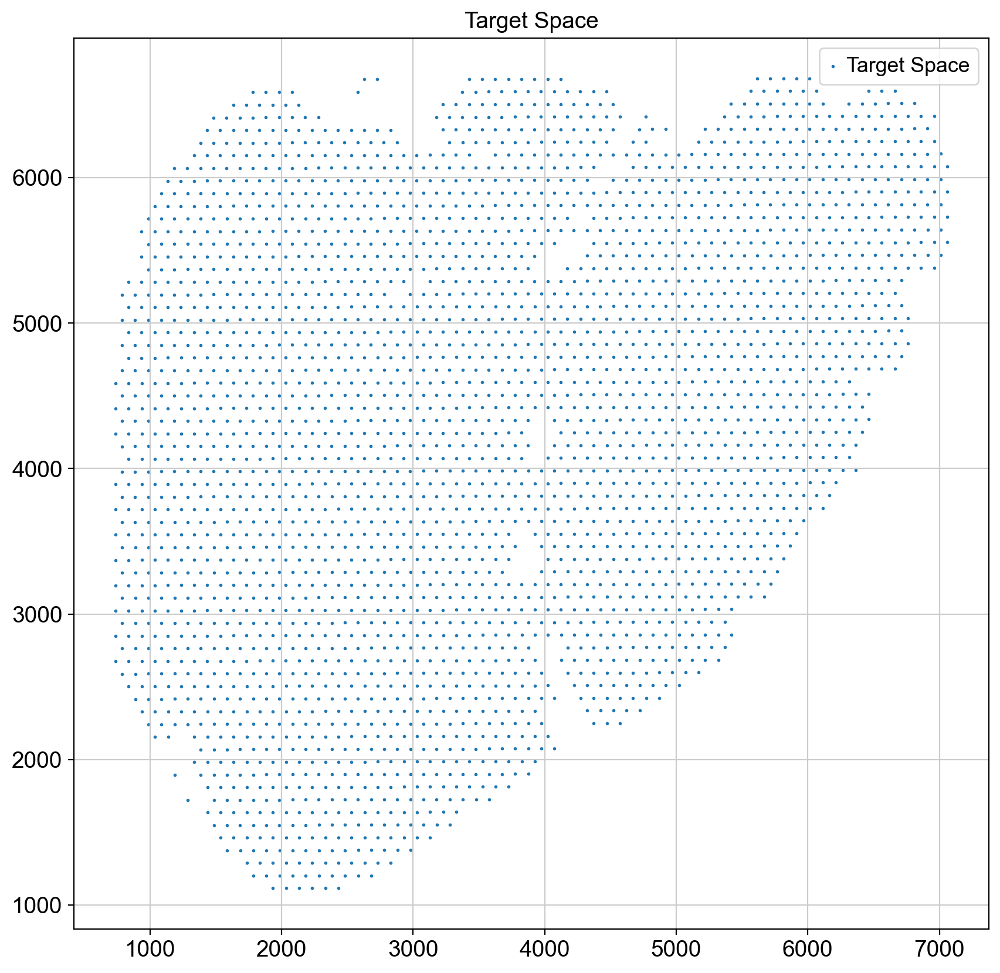

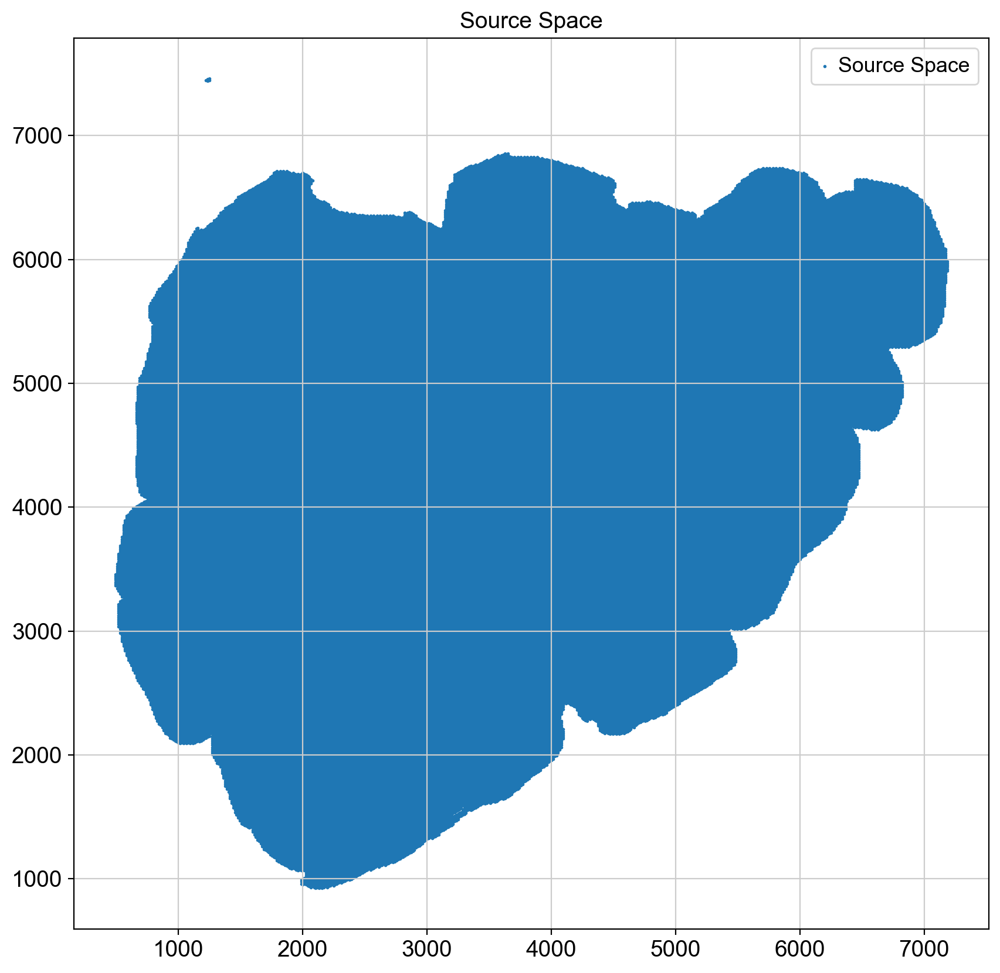

In [ ]:
# read visium info
_,ppm_vis,vis_df = tt.read_visium(spaceranger_dir_path=path+'/',plot=False)
vis_df.rename(columns={'pxl_col': "x", 'pxl_row': "y"},inplace=True) # for new spaceranger adjust for any DF not only for visium
vis_df = tt.map_annotations_to_target(                            
    df_target=vis_df,  
    df_source=df_anno,
    ppm_target= ppm_vis,
    plot=True,
)

In [ ]:
# read visium full data 
import scanpy as sc
adata_vis = sc.read_visium(path,count_file='raw_feature_bc_matrix.h5')

In [ ]:

# Align indices between adata_vis.obs and df_visium_spot
df_visium_spot_aligned = vis_df.iloc[:, 3:].reindex(adata_vis.obs.index)
adata_vis.obs = pd.concat([adata_vis.obs,vis_df.iloc[:,2:]],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
adata_vis

AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 3, 4, 5, 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'x', 'y', 'L2_dist_annotations_Artifacts', 'L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'L2_dist_annotations_Other', 'L2_dist_annotations_PVS', 'L2_dist_annotations_Vessels', 'L2_dist_annotations_unassigned', 'annotations', 'annotations_number', 'cma_2p', 'cma_3p'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

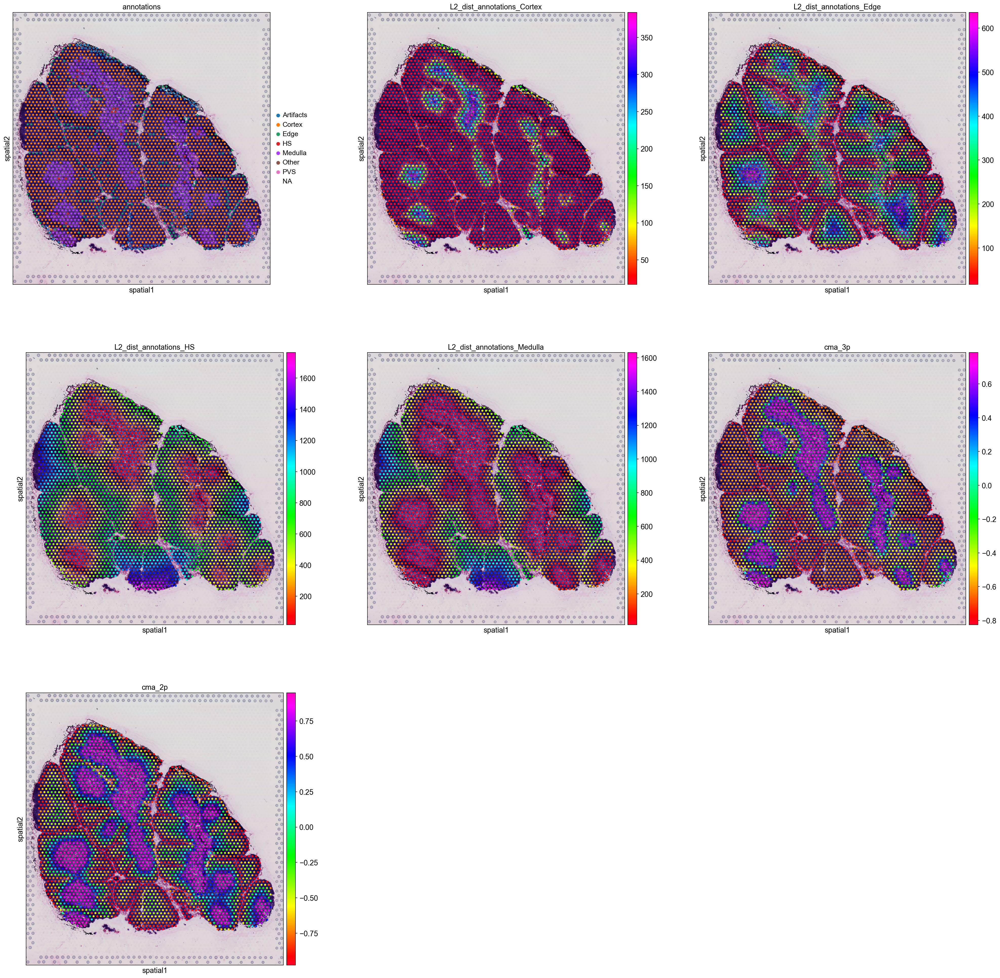

In [10]:
# plot the newly annotated visium AnnData
sc.set_figure_params(figsize=[10,10],dpi=75)
sc.pl.spatial(adata_vis,color=['annotations','L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'cma_3p', 'cma_2p']
              ,cmap='gist_rainbow',ncols=3)